# ENGO 645 Final Project: Preprocessing

By: Lalitha Guru Swaminathan, Mabel Heffring, Saroj Kumar

## Part 1: Data Cleaning and Preparation

### Step 1: Extract Raster Data for each Water Quality Station using QGIS
Talk about it here (to be filled)

### Step 2: Cleaning and Preparing River Water Quality (WQ) Data

- Selecting relevant values
- Removing missing values
- Checking column types and removing prefix


In [1]:
import pandas as pd
wq_rivers = pd.read_csv("data/cleaned/WQ_rivers.csv")
df_wq = wq_rivers
wq_rivers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2916 entries, 0 to 2915
Data columns (total 27 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   StationNumber                              2916 non-null   object 
 1   Latitude                                   2916 non-null   float64
 2   Longitude                                  2916 non-null   float64
 3   SampleDatetime                             2916 non-null   object 
 4   RiverSubBasinCode                          2916 non-null   object 
 5   100923 PH (FIELD) pH units                 2916 non-null   float64
 6   80558 OXYGEN DISSOLVED (FIELD METER) mg/L  2916 non-null   float64
 7   10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L   2916 non-null   float64
 8   102647 NITROGEN NITRATE mg/L               2916 non-null   float64
 9   2014 PHOSPHATE DISSOLVED ORTHO mg/L        2916 non-null   float64
 10  2002 TURBIDITY NTU      

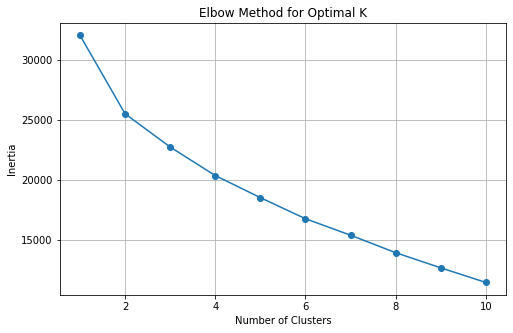

Map saved as kmeans_cluster_map.html


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Select the relevant water quality columns for clustering
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Create a copy to preserve the original data
df_wq = df_wq.copy()

# Convert selected columns to numeric if needed (coercing errors)
df_wq[wq_columns] = df_wq[wq_columns].apply(pd.to_numeric, errors='coerce')

# Handle missing values by filling with column means
df_wq[wq_columns] = df_wq[wq_columns].fillna(df_wq[wq_columns].mean())

# Normalize the water quality data
scaler = StandardScaler()
df_wq_scaled = scaler.fit_transform(df_wq[wq_columns])

# Determine optimal number of clusters using the Elbow method
inertias = []
K_range = range(1, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_wq_scaled)
    inertias.append(kmeans.inertia_)

# Plot Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.show()

# Select optimal k (adjust this based on the elbow plot)
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_wq['kmeans_cluster'] = kmeans.fit_predict(df_wq_scaled)

# Colors for clusters
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow', 'pink', 'cyan', 'brown', 'gray']
cluster_colors = cluster_colors[:optimal_k]

# Create map centered at the mean lat/lon
map_center = [df_wq['Latitude'].mean(), df_wq['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=8, control_scale=True)

# Add markers by cluster
for _, row in df_wq.iterrows():
    cluster = row['kmeans_cluster']
    color = cluster_colors[cluster]
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Station: {row['StationNumber']}, Cluster: {cluster}"
    ).add_to(m)

# Save the map
m.save('kmeans_cluster_map.html')
print("Map saved as kmeans_cluster_map.html")
m

In [3]:
print(df_wq.columns.tolist())

['StationNumber', 'Latitude', 'Longitude', 'SampleDatetime', 'RiverSubBasinCode', '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L', '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L', '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU', '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L', '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm', '106256 FLOW, ESTIMATE N/A', '100925 TEMPERATURE WATER deg C', 'Year', 'Month', 'Elevation', 'Slope', 'LC_1km', 'LC_5km', 'NDVI', 'Temperature', 'Precipitation', 'RP_count', 'kmeans_cluster']


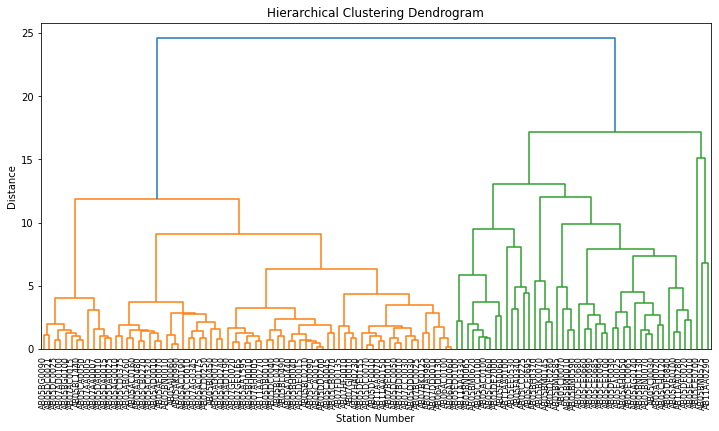

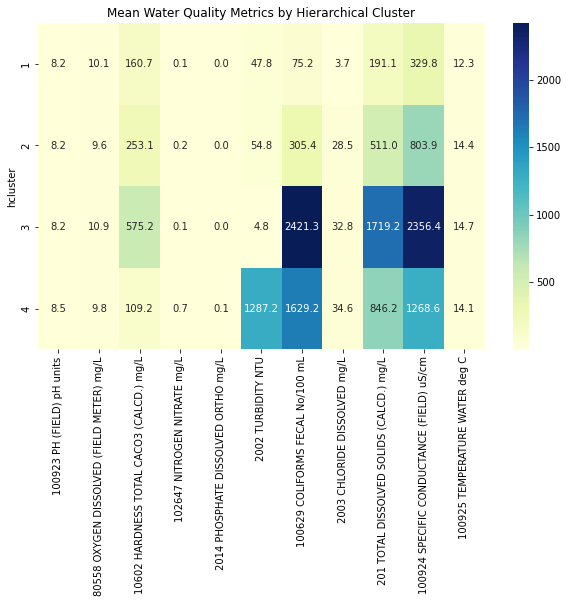

Map saved as hierarchical_cluster_map.html


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import StandardScaler

# Water quality columns
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Aggregate by station and compute mean values for clustering
df_station_mean = df_wq.groupby('StationNumber')[wq_columns].mean()

# Fill any missing values
df_station_mean = df_station_mean.fillna(df_station_mean.mean())

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_station_mean)

# Perform hierarchical clustering
Z = linkage(df_scaled, method='ward', metric='euclidean')

# Visualization 1: Dendrogram
plt.figure(figsize=(12, 6))
dendrogram(Z, labels=df_station_mean.index, leaf_rotation=90, leaf_font_size=8)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Station Number')
plt.ylabel('Distance')
plt.show()

# Assign clusters
num_clusters = 4  # Adjust based on dendrogram inspection
df_station_mean['hcluster'] = fcluster(Z, num_clusters, criterion='maxclust')

# Visualization 2: Heatmap of cluster mean values
cluster_metrics = df_station_mean.groupby('hcluster')[wq_columns].mean()
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_metrics, cmap='YlGnBu', annot=True, fmt='.1f')
plt.title('Mean Water Quality Metrics by Hierarchical Cluster')
plt.show()

# Visualization 3: Folium Map of Clusters
map_center = [df_wq['Latitude'].mean(), df_wq['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=8, control_scale=True)

# Define a color palette
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow']
cluster_colors = cluster_colors[:num_clusters]

# Merge hierarchical cluster labels back to df_wq
df_clustered = df_wq.merge(
    df_station_mean[['hcluster']], on='StationNumber', how='left'
)

# Plot markers by cluster
for _, row in df_clustered.iterrows():
    cluster = int(row['hcluster']) - 1  # for 0-indexed color selection
    color = cluster_colors[cluster]
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Station: {row['StationNumber']}, Cluster: {row['hcluster']}"
    ).add_to(m)

# Save the interactive map
m.save('hierarchical_cluster_map.html')
print("Map saved as hierarchical_cluster_map.html")
m


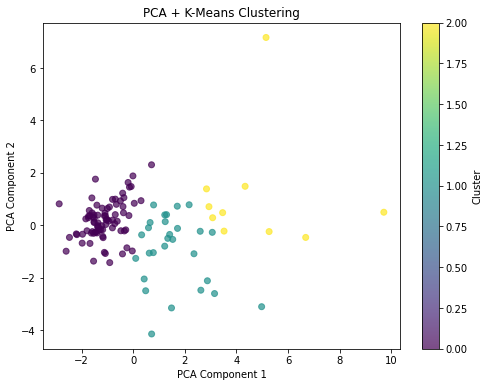

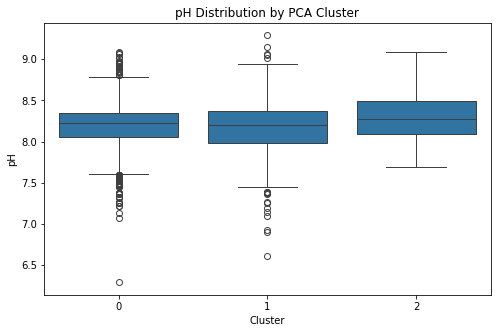

Map saved as pca_kmeans_map.html


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Water quality columns
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Aggregate by station and compute mean values
df_station_mean = wq_rivers.groupby('StationNumber')[wq_columns].mean()
df_station_mean = df_station_mean.fillna(df_station_mean.mean())

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_station_mean)

# Apply PCA
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled)
df_station_mean['pca_1'] = df_pca[:, 0]
df_station_mean['pca_2'] = df_pca[:, 1]

# Apply K-Means clustering
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df_station_mean['pca_cluster'] = kmeans.fit_predict(df_pca)

# Visualization 1: Scatter Plot (PCA + Clustering)
plt.figure(figsize=(8, 6))
plt.scatter(df_station_mean['pca_1'], df_station_mean['pca_2'],
            c=df_station_mean['pca_cluster'], cmap='viridis', alpha=0.7)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA + K-Means Clustering')
plt.colorbar(label='Cluster')
plt.show()

# Merge cluster labels back to original data
df_clustered = wq_rivers.merge(df_station_mean[['pca_cluster']], on='StationNumber', how='left')

# Visualization 2: Box plot (pH by cluster)
plt.figure(figsize=(8, 5))
sns.boxplot(x='pca_cluster', y='100923 PH (FIELD) pH units', data=df_clustered)
plt.title('pH Distribution by PCA Cluster')
plt.xlabel('Cluster')
plt.ylabel('pH')
plt.show()

# Visualization 3: Folium Map of Clusters
map_center = [wq_rivers['Latitude'].mean(), wq_rivers['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=8, control_scale=True)

# Define color palette
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange']
cluster_colors = cluster_colors[:num_clusters]

# Add stations to map
for _, row in df_clustered.iterrows():
    cluster = int(row['pca_cluster'])
    color = cluster_colors[cluster]
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Station: {row['StationNumber']}, PCA Cluster: {row['pca_cluster']}"
    ).add_to(m)

# Save and display
m.save('pca_kmeans_map.html')
print("Map saved as pca_kmeans_map.html")
m


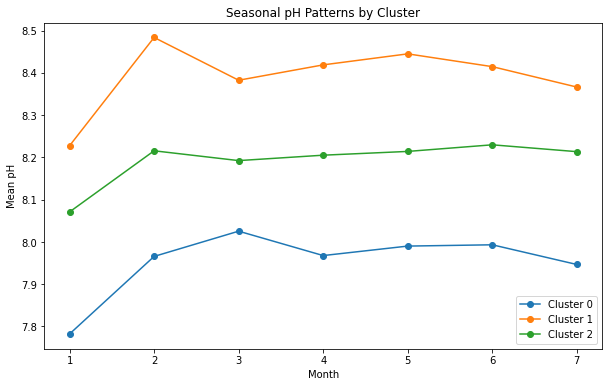

Map saved as ts_clustering_map.html


In [6]:
"""
This code analyzes seasonal pH trends from a water quality dataset (wq_rivers) by first extracting the month 
from a timestamp column and then computing the monthly average pH values for each monitoring station. 
It employs K-Means clustering to categorize these stations based on their pH patterns throughout the year. 
After standardizing the monthly averages, the code fits a K-Means model to the data and assigns cluster 
labels, which are then visualized in a line plot to illustrate seasonal trends for each cluster. Additionally, 
the code generates an interactive Folium map that displays the geographical locations of the stations, 
color-coded by their respective clusters. The resulting map and plots provide insights into the seasonal 
variations in water quality metrics across different monitoring stations.
"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Water quality columns
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Ensure 'SampleDatetime' is in datetime format
wq_rivers['SampleDatetime'] = pd.to_datetime(wq_rivers['SampleDatetime'], errors='coerce')

# Extract month from datetime
wq_rivers['month'] = wq_rivers['SampleDatetime'].dt.month

# Compute monthly pH averages per station
df_monthly = (
    wq_rivers.groupby(['StationNumber', 'month'])['100923 PH (FIELD) pH units']
    .mean()
    .unstack()
)

# Fill missing values using forward fill and backward fill
df_monthly.ffill(axis=1, inplace=True)
df_monthly.bfill(axis=1, inplace=True)

# Normalize and apply K-Means clustering
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_monthly)
num_clusters = 3  # Can be adjusted based on analysis
kmeans_ts = KMeans(n_clusters=num_clusters, random_state=42)
df_monthly['ts_cluster'] = kmeans_ts.fit_predict(df_scaled)

# **Visualization 1: Seasonal pH Trends by Cluster**
centers = scaler.inverse_transform(kmeans_ts.cluster_centers_)  # Convert back to original scale
plt.figure(figsize=(10, 6))
for i, center in enumerate(centers):
    # Ensure center has 12 values for the x-axis
    plt.plot(range(1, 13), np.concatenate((center, [np.nan]*(12-len(center)))), label=f'Cluster {i}', marker='o')
plt.xlabel('Month')
plt.ylabel('Mean pH')
plt.title('Seasonal pH Patterns by Cluster')
plt.legend()
plt.show()

# **Visualization 2: Map of Clusters**
# Get station locations
station_locations = (
    wq_rivers.groupby('StationNumber')[['Latitude', 'Longitude']]
    .first()
)
station_locations['ts_cluster'] = df_monthly['ts_cluster']

# Create interactive Folium map
map_center = [
    wq_rivers['Latitude'].mean(),
    wq_rivers['Longitude'].mean()
]
m = folium.Map(location=map_center, zoom_start=8)

# Define colors for clusters
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange']
cluster_colors = cluster_colors[:num_clusters]  # Select required colors

# Add stations to the map with colored markers
for station, row in station_locations.iterrows():
    cluster = int(row['ts_cluster'])
    color = cluster_colors[cluster]
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {station}, Cluster: {cluster}",
        icon=folium.Icon(color=color)
    ).add_to(m)

# Save and display the map
m.save('ts_clustering_map.html')
print("Map saved as ts_clustering_map.html")
m


Map saved as dbscan_map.html


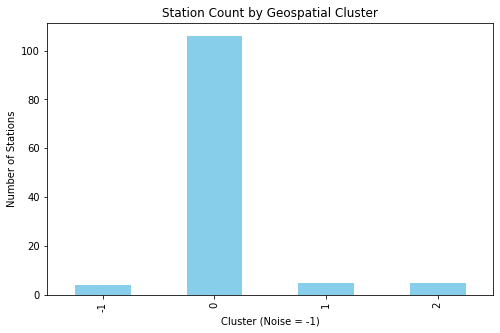

In [7]:
"""
This code performs geospatial clustering of monitoring stations in a water quality dataset (wq_rivers) 
using the DBSCAN algorithm. It begins by converting the latitude and longitude coordinates of the stations
to radians and then applies DBSCAN with a Haversine metric to identify clusters based on spatial proximity, 
considering stations within a specified distance (100 km). After clustering, it prepares the coordinates
along with their respective cluster labels and creates an interactive Folium map that visually represents 
each station, color-coded by its cluster assignment, with noise points (outliers) indicated in gray. 
Additionally, it generates a bar plot displaying the number of stations within each identified cluster, 
allowing for easy visualization of clustering results. The resulting map and plot provide insights into 
the spatial distribution and grouping of monitoring stations based on their geographical locations.
"""
import numpy as np
import pandas as pd
import folium
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Convert coordinates (latitude, longitude) to radians and drop duplicate stations
coords = np.deg2rad(wq_rivers[['Latitude', 'Longitude']].drop_duplicates())

# Run DBSCAN with Haversine metric (eps in radians)
# Here, eps=100 km converted to radians using Earth's radius ~6371 km
dbscan = DBSCAN(eps=100/6371, min_samples=3, metric='haversine')
labels = dbscan.fit_predict(coords)

# Prepare station coordinates with cluster labels
station_coords = wq_rivers[['StationNumber', 'Latitude', 'Longitude']].drop_duplicates().copy()
station_coords['geo_cluster'] = labels

# Define map center from the mean of coordinates
map_center = [
    wq_rivers['Latitude'].mean(),
    wq_rivers['Longitude'].mean()
]

# Define a list of colors for clusters; gray will be used for noise (-1)
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow']
noise_color = 'gray'

# Create a Folium map
m = folium.Map(location=map_center, zoom_start=10, control_scale=True)

# Add markers to the map with color based on DBSCAN cluster
for _, row in station_coords.iterrows():
    cluster = int(row['geo_cluster'])
    if cluster == -1:
        color = noise_color
    else:
        color = cluster_colors[cluster % len(cluster_colors)]
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['StationNumber']}<br>Cluster: {cluster}",
        icon=folium.Icon(color=color)
    ).add_to(m)

# Save the map as HTML
m.save('dbscan_map.html')
print("Map saved as dbscan_map.html")

# Create a bar plot of cluster sizes (noise is represented by -1)
cluster_counts = station_coords['geo_cluster'].value_counts().sort_index()
plt.figure(figsize=(8, 5))
cluster_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Cluster (Noise = -1)')
plt.ylabel('Number of Stations')
plt.title('Station Count by Geospatial Cluster')
plt.show()

m

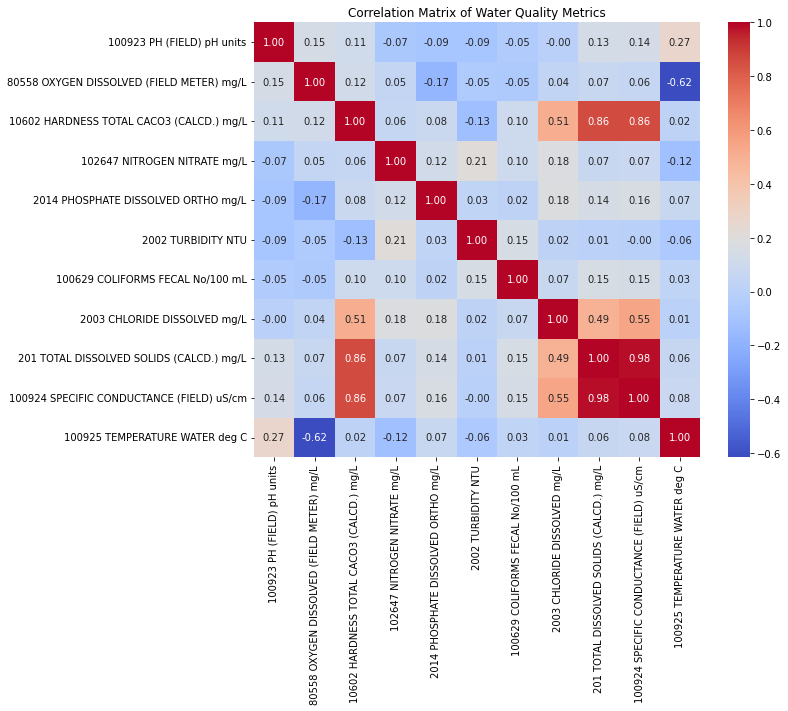

Kruskal-Wallis Test: stat=875.87, p=0.0000


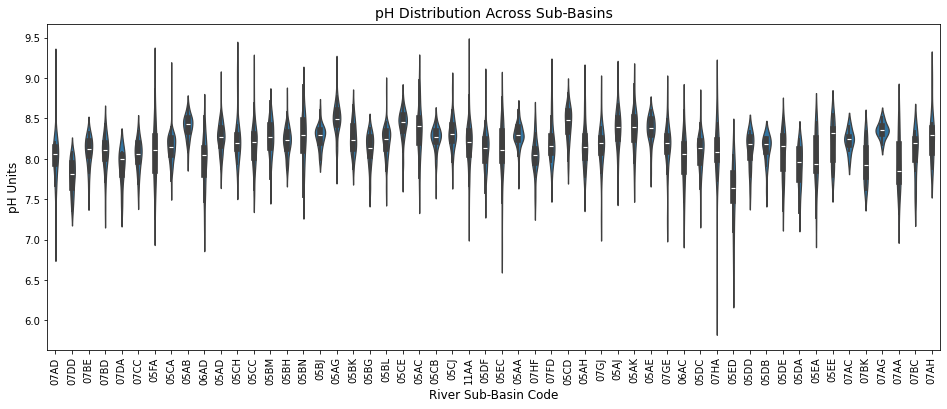

Map saved as subbasin_map.html


/var/folders/wc/1tnclns971z0sxfhcd62cgtm0000gn/T/ipykernel_41666/3902810068.py:63: UserWarning: color argument of Icon should be one of: {'darkblue', 'darkred', 'green', 'darkpurple', 'black', 'lightred', 'cadetblue', 'lightgreen', 'purple', 'darkgreen', 'lightblue', 'blue', 'beige', 'gray', 'lightgray', 'pink', 'red', 'orange', 'white'}.
  icon=folium.Icon(color=colors[idx % len(colors)])  # Cycle through colors


In [8]:
"""
Define Columns: Specifies water quality parameters to analyze from the wq_rivers DataFrame.
Correlation Matrix: Computes and visualizes a correlation matrix for selected metrics using a heatmap.
Kruskal-Wallis Test: Performs the test to compare pH levels across river sub-basins and prints the results.
Violin Plot: Creates a violin plot to visualize pH distribution across sub-basins, with adjusted sizes and labels.
Map of Sub-Basins: Retrieves sub-basin locations and creates a Folium map with markers for each sub-basin.
Save Map: Saves the map as an HTML file (subbasin_map.html).
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from scipy.stats import kruskal

# Water quality columns
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# **Correlation Matrix Visualization**
corr = wq_rivers[wq_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Water Quality Metrics')
plt.show()

# **Kruskal-Wallis Test for pH Across Sub-Basins**
ph_by_subbasin = [group['100923 PH (FIELD) pH units'].dropna() for _, group in wq_rivers.groupby('RiverSubBasinCode')]
stat, p = kruskal(*ph_by_subbasin)
print(f"Kruskal-Wallis Test: stat={stat:.2f}, p={p:.4f}")

# **Violin Plot of pH Distribution**
plt.figure(figsize=(16, 6))  # Increase figure width for better visibility
sns.violinplot(x='RiverSubBasinCode', y='100923 PH (FIELD) pH units', data=wq_rivers)
plt.xticks(rotation=90, fontsize=10)  # Rotate and increase font size for x-axis labels
plt.title('pH Distribution Across Sub-Basins', fontsize=14)
plt.xlabel('River Sub-Basin Code', fontsize=12)
plt.ylabel('pH Units', fontsize=12)
plt.show()


# **Visualization: Map of Sub-Basins**
# Get unique sub-basin locations (assuming you have the coordinates)
subbasin_locations = wq_rivers.groupby('RiverSubBasinCode')[['Latitude', 'Longitude']].first().reset_index()

# Create Folium map centered on average location of sub-basins
map_center = [subbasin_locations['Latitude'].mean(), subbasin_locations['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=8)

# Add sub-basin markers to the map
colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow']  # Define colors for clusters
for idx, row in subbasin_locations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Sub-Basin: {row['RiverSubBasinCode']}",
        icon=folium.Icon(color=colors[idx % len(colors)])  # Cycle through colors
    ).add_to(m)

# Save and display the map
m.save('subbasin_map.html')
print("Map saved as subbasin_map.html")
m

In [11]:
wq_rivers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2916 entries, 0 to 2915
Data columns (total 28 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   StationNumber                              2916 non-null   object        
 1   Latitude                                   2916 non-null   float64       
 2   Longitude                                  2916 non-null   float64       
 3   SampleDatetime                             2916 non-null   datetime64[ns]
 4   RiverSubBasinCode                          2916 non-null   object        
 5   100923 PH (FIELD) pH units                 2916 non-null   float64       
 6   80558 OXYGEN DISSOLVED (FIELD METER) mg/L  2916 non-null   float64       
 7   10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L   2916 non-null   float64       
 8   102647 NITROGEN NITRATE mg/L               2916 non-null   float64       
 9   2014 PHOSPHATE DISS

/var/folders/wc/1tnclns971z0sxfhcd62cgtm0000gn/T/ipykernel_41666/86174937.py:62: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  slopes = wq_rivers.groupby('StationNumber').apply(


Map saved as geo_temporal_map.html


/var/folders/wc/1tnclns971z0sxfhcd62cgtm0000gn/T/ipykernel_41666/86174937.py:121: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values = row.tolist() + [row[0]]  # Close the radar chart loop


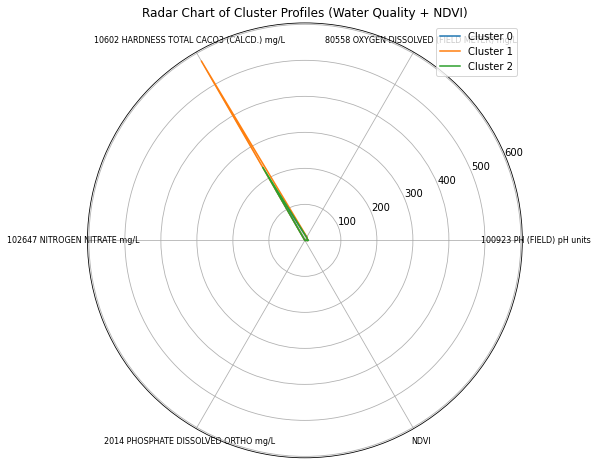

In [14]:
"""
Data Aggregation: Groups the data by StationNumber, calculating the mean of water quality metric
s (e.g., pH, dissolved oxygen, nitrates) and environmental factors (e.g., elevation, NDVI), 
while retaining station coordinates (latitude, longitude).

pH Trend Analysis: Computes the slope of pH changes over time for each station using linear regression,
adding it as a feature.

Clustering: Scales the combined features (water quality, environmental data, pH slope, and coordinates) and 
applies K-Means clustering to group stations into 3 clusters based on similarities.

Visualization 1 - Map: Creates an interactive Folium map showing station locations, color-coded by cluster, 
with popups displaying cluster ID, pH slope, and selected environmental data.

Visualization 2 - Radar Chart: Generates a radar chart comparing the average values of selected water quality
metrics and NDVI across clusters, highlighting differences in their profiles.
"""
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression

# Updated water quality columns (keeping all relevant ones)
wq_columns = [
    '100923 PH (FIELD) pH units', 
    '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', 
    '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', 
    '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', 
    '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', 
    '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Additional environmental features
env_columns = [
    'Elevation',
    'Slope',
    'NDVI',
    'Temperature',
    'Precipitation'
]

# Group by 'StationNumber' and calculate mean for water quality and environmental columns
df_station_mean = (
    wq_rivers.groupby('StationNumber')
    .agg(
        **{col: (col, 'mean') for col in wq_columns + env_columns},  # Calculate mean for all columns
        Latitude=('Latitude', 'first'),  # Retain first occurrence of Latitude
        Longitude=('Longitude', 'first')  # Retain first occurrence of Longitude
    )
    .fillna(0)  # Fill NaNs with 0
)

# Calculate pH slope for each station
slopes = wq_rivers.groupby('StationNumber').apply(
    lambda g: LinearRegression().fit(
        (g['SampleDatetime'] - g['SampleDatetime'].min()).dt.days.values.reshape(-1, 1),
        g['100923 PH (FIELD) pH units'].fillna(0)
    ).coef_[0] if len(g) > 1 else 0
)

df_station_mean['pH_slope'] = slopes

# Updated features for scaling and clustering
features = wq_columns + env_columns + ['pH_slope', 'Latitude', 'Longitude']

# Scale features and perform K-Means clustering
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_station_mean[features])
num_clusters = 3  # Adjust based on your analysis
kmeans_gt = KMeans(n_clusters=num_clusters, random_state=42)
df_station_mean['gt_cluster'] = kmeans_gt.fit_predict(df_scaled)

# **Visualization 1: Folium Map of Clusters**
map_center = [
    df_station_mean['Latitude'].mean(),
    df_station_mean['Longitude'].mean()
]
m = folium.Map(location=map_center, zoom_start=10)

# Define colors for clusters
colors = {0: 'red', 1: 'blue', 2: 'green'}

# Add markers for each station with cluster information (enhanced popup)
for _, row in df_station_mean.iterrows():
    popup_text = (f"Cluster: {row['gt_cluster']}<br>"
                 f"pH Slope: {row['pH_slope']:.2f}<br>"
                 f"Elevation: {row['Elevation']:.1f}m<br>"
                 f"NDVI: {row['NDVI']:.2f}<br>"
                 f"Precipitation: {row['Precipitation']:.1f}mm")
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text,
        icon=folium.Icon(color=colors[row['gt_cluster']])
    ).add_to(m)

# Save the map
m.save('geo_temporal_map.html')
print("Map saved as geo_temporal_map.html")

# **Visualization 2: Radar Chart for Cluster Profiles**
from math import pi

# Calculate mean values for selected metrics by cluster (using 6 metrics for better representation)
selected_metrics = wq_columns[:5] + ['NDVI']  # Adding NDVI as an environmental factor
means = df_station_mean.groupby('gt_cluster')[selected_metrics].mean()
angles = [n / 6 * 2 * pi for n in range(6)] + [0]

# Create radar chart
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

for i, row in means.iterrows():
    values = row.tolist() + [row[0]]  # Close the radar chart loop
    ax.plot(angles, values, label=f'Cluster {i}')
    ax.fill(angles, values, alpha=0.1)  # Fill area under the curve

ax.set_xticks(angles[:-1])
ax.set_xticklabels(selected_metrics, fontsize=8)
plt.title('Radar Chart of Cluster Profiles (Water Quality + NDVI)')
plt.legend()
plt.show()

m

In [10]:
print(wq_rivers.columns)


Index(['StationNumber', 'Latitude', 'Longitude', 'SampleDatetime',
       'RiverSubBasinCode', '100923 PH (FIELD) pH units',
       '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
       '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L',
       '102647 NITROGEN NITRATE mg/L', '2014 PHOSPHATE DISSOLVED ORTHO mg/L',
       '2002 TURBIDITY NTU', '100629 COLIFORMS FECAL No/100 mL',
       '2003 CHLORIDE DISSOLVED mg/L',
       '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L',
       '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
       '106256 FLOW, ESTIMATE N/A', '100925 TEMPERATURE WATER deg C', 'Year',
       'Month', 'Elevation', 'Slope', 'LC_1km', 'LC_5km', 'NDVI',
       'Temperature', 'Precipitation', 'RP_count', 'month'],
      dtype='object')


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# Normalize data
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_station_mean[wq_columns])

# Hierarchical clustering
Z = linkage(df_scaled, method='average', metric='cosine')
df_station_mean['fp_cluster'] = fcluster(Z, t=0.5, criterion='distance')

# **Visualization 1: Dendrogram**
plt.figure(figsize=(12, 6))
dendrogram(Z, labels=df_station_mean.index, leaf_rotation=90, leaf_font_size=8)
plt.title('Water Quality Fingerprint Clustering')
plt.xlabel('Station Number')
plt.ylabel('Distance')
plt.show()

# **Visualization 2: Map of Clusters**
# Get station locations from the original DataFrame
station_locations = (
    wq2022_rivers_cleaned.groupby('StationNumber')[['LatitudeDecimalDegrees', 'LongitudeDecimalDegrees']]
    .first()
)

# Merge the cluster labels back into the station locations DataFrame
station_locations = station_locations.merge(df_monthly[['ts_cluster']], left_index=True, right_index=True)

# Create interactive Folium map
map_center = [
    wq2022_rivers_cleaned['LatitudeDecimalDegrees'].mean(),
    wq2022_rivers_cleaned['LongitudeDecimalDegrees'].mean()
]
m = folium.Map(location=map_center, zoom_start=8)

# Define colors for clusters
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange']
cluster_colors = cluster_colors[:num_clusters]  # Select required colors

# Add stations to the map with colored markers
for station, row in station_locations.iterrows():
    cluster = int(row['ts_cluster'])
    color = cluster_colors[cluster]
    folium.Marker(
        location=[row['LatitudeDecimalDegrees'], row['LongitudeDecimalDegrees']],
        popup=f"Station: {station}, Cluster: {cluster}",
        icon=folium.Icon(color=color)
    ).add_to(m)

# Save and display the map
m.save('ts_clustering_map.html')
print("Map saved as ts_clustering_map.html")
m

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

# Prepare and scale the data
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Normalize the data
df_wq = wq2022_rivers_cleaned[wq_columns].fillna(0)  # Handle missing values
scaler = StandardScaler()
df_wq_scaled = scaler.fit_transform(df_wq)

# Detect anomalies using Isolation Forest
iso = IsolationForest(contamination=0.05, random_state=42)
wq2022_rivers_cleaned['anomaly'] = iso.fit_predict(df_wq_scaled)

# **Visualization 1: Map of Anomalies**
map_center = [
    wq2022_rivers_cleaned['LatitudeDecimalDegrees'].mean(),
    wq2022_rivers_cleaned['LongitudeDecimalDegrees'].mean()
]
m = folium.Map(location=map_center, zoom_start=10)

# Add markers to the map
for _, row in wq2022_rivers_cleaned.iterrows():
    color = 'red' if row['anomaly'] == -1 else 'blue'
    folium.Marker(
        location=[row['LatitudeDecimalDegrees'], row['LongitudeDecimalDegrees']],
        popup='Anomaly' if row['anomaly'] == -1 else 'Normal',
        icon=folium.Icon(color=color)
    ).add_to(m)

# Save the map
m.save('anomaly_map.html')
print("Map saved as anomaly_map.html")

# **Visualization 2: Histogram of pH for Anomalies vs. Normal**
plt.figure(figsize=(8, 5))
sns.histplot(data=wq2022_rivers_cleaned, x='100923 PH (FIELD) pH units', hue='anomaly', multiple='stack', bins=30)
plt.title('pH Distribution: Anomalies vs. Normal')
plt.xlabel('pH Levels')
plt.ylabel('Frequency')
plt.show()
m

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Assuming wq2022_rivers_cleaned is your DataFrame
# Water quality columns
wq_columns = [
    '100923 PH (FIELD) pH units', '80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
    '10602 HARDNESS TOTAL CACO3 (CALCD.) mg/L', '102647 NITROGEN NITRATE mg/L',
    '2014 PHOSPHATE DISSOLVED ORTHO mg/L', '2002 TURBIDITY NTU',
    '100629 COLIFORMS FECAL No/100 mL', '2003 CHLORIDE DISSOLVED mg/L',
    '201 TOTAL DISSOLVED SOLIDS (CALCD.) mg/L', '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm',
    '100925 TEMPERATURE WATER deg C'
]

# Group by River Sub-Basin and compute mean metrics
df_subbasin_mean = wq2022_rivers_cleaned.groupby('RiverSubBasinCode')[wq_columns].mean().fillna(0)

# Normalize and apply K-Means clustering
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_subbasin_mean)
num_clusters = 3  # Number of clusters
kmeans_sb = KMeans(n_clusters=num_clusters, random_state=42)
df_subbasin_mean['sb_cluster'] = kmeans_sb.fit_predict(df_scaled)

# **Visualization 1: Bar Plot of Cluster Centers**
centers = pd.DataFrame(scaler.inverse_transform(kmeans_sb.cluster_centers_), columns=wq_columns)
plt.figure(figsize=(12, 6))
centers.T.plot(kind='bar')
plt.title('Sub-Basin Cluster Centers')
plt.ylabel('Metric Value')
plt.xticks(rotation=90)
plt.legend(title='Cluster')
plt.show()

# **Visualization 2: Heatmap of Mean Metrics by Cluster**
plt.figure(figsize=(10, 6))
sns.heatmap(df_subbasin_mean.groupby('sb_cluster')[wq_columns].mean(), cmap='viridis', annot=True, fmt='.1f')
plt.title('Mean Metrics by Sub-Basin Cluster')
plt.show()

# **Visualization 3: Map of Sub-Basin Clusters**
# Calculate mean coordinates for each sub-basin
subbasin_coordinates = wq2022_rivers_cleaned.groupby('RiverSubBasinCode')[['LatitudeDecimalDegrees', 'LongitudeDecimalDegrees']].mean().to_dict(orient='index')

# Create a Folium map centered at the mean coordinates
map_center = [
    np.mean([coord['LatitudeDecimalDegrees'] for coord in subbasin_coordinates.values()]),
    np.mean([coord['LongitudeDecimalDegrees'] for coord in subbasin_coordinates.values()])
]
m = folium.Map(location=map_center, zoom_start=7)

# Define a color map for clusters
cluster_colors = ['red', 'blue', 'green']
cluster_colors = cluster_colors[:num_clusters]  # Select only required colors

# Add sub-basins to the map with colored markers
for subbasin, coord in subbasin_coordinates.items():
    cluster = df_subbasin_mean.loc[subbasin, 'sb_cluster']  # Get cluster
    color = cluster_colors[cluster]
    folium.Marker(
        location=[coord['LatitudeDecimalDegrees'], coord['LongitudeDecimalDegrees']],
        popup=f"Sub-Basin: {subbasin}, Cluster: {cluster}",
        icon=folium.Icon(color=color)
    ).add_to(m)

# Save and display the map
m.save('subbasin_clustering_map.html')
print("Map saved as subbasin_clustering_map.html")
m


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Assuming wq2022_rivers_cleaned is your DataFrame
# Water quality columns excluding flow estimate
wq_no_flow = [col for col in wq_columns if col != '106256 FLOW, ESTIMATE N/A']

# Calculate load by multiplying water quality metrics by flow estimate
df_load = wq2022_rivers_cleaned[wq_no_flow].multiply(wq2022_rivers_cleaned['106256 FLOW, ESTIMATE N/A'].fillna(0), axis=0)

# Normalize and apply K-Means clustering
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_load)
num_clusters = 3  # Number of clusters
kmeans_load = KMeans(n_clusters=num_clusters, random_state=42)
wq2022_rivers_cleaned['load_cluster'] = kmeans_load.fit_predict(df_scaled)

# **Visualization 1: Map of Load Clusters**
# Create a Folium map centered at the mean coordinates
map_center = [
    np.mean(wq2022_rivers_cleaned['LatitudeDecimalDegrees']),
    np.mean(wq2022_rivers_cleaned['LongitudeDecimalDegrees'])
]
m = folium.Map(location=map_center, zoom_start=10)

# Define a color map for clusters
cluster_colors = ['red', 'blue', 'green']
cluster_colors = cluster_colors[:num_clusters]  # Select only required colors

# Add each data point to the map with colored markers
for _, row in wq2022_rivers_cleaned.iterrows():
    folium.Marker(
        location=[row['LatitudeDecimalDegrees'], row['LongitudeDecimalDegrees']],
        popup=f"Cluster: {row['load_cluster']}",
        icon=folium.Icon(color=cluster_colors[row['load_cluster']])
    ).add_to(m)

# Save and display the map
m.save('load_map.html')
print("Map saved as load_map.html")
m

# **Visualization 2: Bar Plot of Mean Nitrate Load by Cluster**
plt.figure(figsize=(8, 5))
wq2022_rivers_cleaned.groupby('load_cluster')['102647 NITROGEN NITRATE mg/L'].mean().plot(kind='bar', color=cluster_colors)
plt.title('Mean Nitrate Load by Cluster')
plt.ylabel('Nitrate Load')
plt.xticks(rotation=0)
plt.show()
m

In [ ]:
'''
Purpose

The primary purpose of this code is to analyze and visualize seasonal temperature patterns across different geographical locations. By clustering the temperature data, we can identify regions with similar seasonal variations, which can be useful for environmental monitoring, climate studies, or water management strategies.

Outputs

Line Plot: Displays the average monthly temperature for each cluster, highlighting the seasonal patterns.
Interactive Map: Shows the geographical distribution of the clusters, allowing users to visually inspect how different regions are grouped based on their temperature profiles.
This code provides a comprehensive approach to analyzing and visualizing temporal and spatial patterns in water temperature data.
'''

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Assuming wq2022_rivers_cleaned is your DataFrame
# Calculate monthly mean temperature for each station
df_temp_monthly = wq2022_rivers_cleaned.groupby(['StationNumber', 'month'])['100925 TEMPERATURE WATER deg C'].mean().unstack().fillna(method='ffill')

# Normalize and apply K-Means clustering
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_temp_monthly)
num_clusters = 3  # Number of clusters
kmeans_temp = KMeans(n_clusters=num_clusters, random_state=42)
df_temp_monthly['temp_cluster'] = kmeans_temp.fit_predict(df_scaled)

# Ensure cluster labels are integers
df_temp_monthly['temp_cluster'] = df_temp_monthly['temp_cluster'].astype(int)

# **Visualization 1: Line Plot of Cluster Centers**
centers = scaler.inverse_transform(kmeans_temp.cluster_centers_)
plt.figure(figsize=(10, 6))
for i, center in enumerate(centers):
    plt.plot(range(1, 13), center, label=f'Cluster {i}', marker='o')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.title('Seasonal Temperature Patterns by Cluster')
plt.legend()
plt.show()

# **Visualization 2: Map of Temperature Clusters**
# Assuming station_locations is a DataFrame with station coordinates
station_locations = wq2022_rivers_cleaned.groupby('StationNumber')[['LatitudeDecimalDegrees', 'LongitudeDecimalDegrees']].mean()
station_locations = station_locations.join(df_temp_monthly['temp_cluster'], how='left')

# Create a Folium map centered at the mean coordinates
map_center = [
    np.mean(station_locations['LatitudeDecimalDegrees']),
    np.mean(station_locations['LongitudeDecimalDegrees'])
]
m = folium.Map(location=map_center, zoom_start=10)

# Define a color map for clusters
cluster_colors = ['red', 'blue', 'green']
cluster_colors = cluster_colors[:num_clusters]  # Select only required colors

# Add each station to the map with colored markers
for _, row in station_locations.iterrows():
    # Ensure the cluster label is an integer
    cluster_label = int(row['temp_cluster'])
    folium.Marker(
        location=[row['LatitudeDecimalDegrees'], row['LongitudeDecimalDegrees']],
        popup=f"Cluster: {cluster_label}",
        icon=folium.Icon(color=cluster_colors[cluster_label])
    ).add_to(m)

# Save and display the map
m.save('seasonal_map.html')
print("Map saved as seasonal_map.html")
m


In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import folium
from sklearn.metrics.pairwise import haversine_distances

# Convert station coordinates to radians for distance calculation
coords_rad = np.deg2rad(station_locations[['LatitudeDecimalDegrees', 'LongitudeDecimalDegrees']])
dist_matrix = haversine_distances(coords_rad) * 6371  # Distance in kilometers

# Create a graph and add nodes for each station
G = nx.Graph()
for station in station_locations.index:
    G.add_node(station)

# Add edges between stations that are within 10 km of each other
for i, s1 in enumerate(station_locations.index):
    for j, s2 in enumerate(station_locations.index[i+1:], start=i+1):
        if dist_matrix[i, j] < 10:
            G.add_edge(s1, s2)

# Detect communities using the Louvain method
communities = nx.algorithms.community.louvain_communities(G)
comm_dict = {s: i for i, comm in enumerate(communities) for s in comm}
station_locations['community'] = [comm_dict.get(s, -1) for s in station_locations.index]

# Ensure community labels are integers
station_locations['community'] = station_locations['community'].astype(int)

# **Visualization 1: Map of Communities**
# Create a Folium map centered at the mean coordinates
map_center = [
    np.mean(station_locations['LatitudeDecimalDegrees']),
    np.mean(station_locations['LongitudeDecimalDegrees'])
]
m = folium.Map(location=map_center, zoom_start=10)

# Define a color map for communities
community_colors = ['red', 'blue', 'green', 'purple', 'gray']

# Add each station to the map with colored markers
for _, row in station_locations.iterrows():
    # Ensure the community label is an integer
    community_label = int(row['community'])
    color = community_colors[min(community_label, len(community_colors)-1)]
    folium.Marker(
        location=[row['LatitudeDecimalDegrees'], row['LongitudeDecimalDegrees']],
        popup=f"Community: {community_label}",
        icon=folium.Icon(color=color)
    ).add_to(m)

# Save the map as an HTML file
m.save('graph_map.html')
print("Map saved as graph_map.html. Open this file in a web browser to view the interactive map.")
m

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Assuming df_station_mean is your DataFrame and wq_columns are the water quality columns
# Normalize the water quality data
scaler = StandardScaler()
df_norm = pd.DataFrame(
    scaler.fit_transform(df_station_mean[wq_columns]),
    columns=wq_columns,
    index=df_station_mean.index
)

# Add the existing cluster labels to the normalized DataFrame
df_norm['gt_cluster'] = df_station_mean['gt_cluster']

# **Visualization: Parallel Coordinates Plot**
plt.figure(figsize=(12, 6))
pd.plotting.parallel_coordinates(df_norm, 'gt_cluster', colormap='viridis')
plt.title('Parallel Coordinates for Clusters')
plt.xticks(rotation=45)
plt.show()


In [ ]:
import ipyvolume as ipv
import numpy as np
import ipyvolume.pylab as p3

# Enable notebook integration
ipv.clear()
fig = ipv.figure(width=800, height=600)

# Get cluster data
clusters = wq2022_rivers_cleaned['load_cluster'].unique()

# Create color map
colors = plt.cm.tab10(range(len(clusters)))

# Plot each cluster
for i, cluster in enumerate(clusters):
    cluster_data = wq2022_rivers_cleaned[wq2022_rivers_cleaned['load_cluster'] == cluster]
    
    x = cluster_data['100923 PH (FIELD) pH units'].values
    y = cluster_data['102647 NITROGEN NITRATE mg/L'].values
    z = cluster_data['100925 TEMPERATURE WATER deg C'].values
    
    # Plot scatter points
    ipv.scatter(x, y, z, color=colors[i], marker='sphere', size=2, 
                name=f'Cluster {cluster}')

# Set axis labels
ipv.xlabel('pH')
ipv.ylabel('Nitrate (mg/L)')
ipv.zlabel('Temperature (°C)')

# Add a legend
ipv.style.use(['dark'])
ipv.show()

ipv.save('interactive_3d_plot.html')
print('saved 3d plot')

### Step 3: Cleaning and Preparing Lake Water Quality (WQ) Data

- Selecting relevant values
- Removing missing values
- Checking column types and removing prefix

In [ ]:
# Importing WQ data for all 5 years
wq2018_lakes = pd.read_csv("data/water_quality/2018_WQ_lakes.csv")
wq2019_lakes = pd.read_csv("data/water_quality/2019_WQ_lakes.csv")
wq2020_lakes = pd.read_csv("data/water_quality/2020_WQ_lakes.csv")
wq2021_lakes = pd.read_csv("data/water_quality/2021_WQ_lakes.csv")
wq2022_lakes = pd.read_csv("data/water_quality/2022_WQ_lakes.csv")

# Selecting relevant features
relevant_features = ['StationNumber', 'LatitudeDecimalDegrees','LongitudeDecimalDegrees', 'SampleDatetime',
                     'RiverSubBasinCode', '100923 PH (FIELD) pH units','80558 OXYGEN DISSOLVED (FIELD METER) mg/L',
                     '100924 SPECIFIC CONDUCTANCE (FIELD) uS/cm','100925 TEMPERATURE WATER deg C']

wq2018_lakes_cleaned = wq2018_lakes[relevant_features]
wq2019_lakes_cleaned = wq2019_lakes[relevant_features]
wq2020_lakes_cleaned = wq2020_lakes[relevant_features]
wq2021_lakes_cleaned = wq2021_lakes[relevant_features]
wq2022_lakes_cleaned = wq2022_lakes[relevant_features]

# removing nan values
wq2018_lakes_cleaned = wq2018_lakes_cleaned.dropna()
wq2019_lakes_cleaned = wq2019_lakes_cleaned.dropna()
wq2020_lakes_cleaned = wq2020_lakes_cleaned.dropna()
wq2021_lakes_cleaned = wq2021_lakes_cleaned.dropna()
wq2022_lakes_cleaned = wq2022_lakes_cleaned.dropna()

# fixing data types
wq2018_lakes_cleaned = change_datatypes(wq2018_lakes_cleaned)
wq2019_lakes_cleaned = change_datatypes(wq2019_lakes_cleaned)
wq2020_lakes_cleaned = change_datatypes(wq2020_lakes_cleaned)
wq2021_lakes_cleaned = change_datatypes(wq2021_lakes_cleaned)
wq2022_lakes_cleaned = change_datatypes(wq2022_lakes_cleaned)

# combining water quality results for all 5 years
wq_lakes = pd.concat([wq2018_lakes_cleaned, wq2019_lakes_cleaned, wq2020_lakes_cleaned, wq2021_lakes_cleaned, wq2022_lakes_cleaned], axis=0, ignore_index=True)

# printing data frame information
wq_lakes.info()

### Step 4: Cleaning and Preparing Climate Data
- Selecting relevant values
- Combining data for each month
- Removing missing values 

In [ ]:
import os

# path to files
dir = 'data/precipitation'

# initiating data frame
climate_data = pd.DataFrame()

# months to loop through
months = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']
# years to loop through
years = ['2018', '2019', '2020', '2021', '2022']

# Looping through each file and selecting relevant values
for y in years:
    for m in months:
        current_path = os.path.join(dir, 'en_climate_summaries_AB_' + m + '-' + y +'.csv')
        current_data = pd.read_csv(current_path)

        current_data_clean = current_data[['Long', 'Lat', 'Clim_ID', 'Tm', 'P']].copy()

        current_data_clean['month'] = int(m)
        current_data_clean['year'] = int(y)

        climate_data = pd.concat([climate_data, current_data_clean], axis=0, ignore_index=True)

# removing missing values
climate_data = climate_data.dropna()

# printing data frame information
climate_data.info()


### Step 5: Cleaning and Preparing NDVI Data
- Convert date column
- remove missing values


In [ ]:
# reading in the NDVI data
ndvi_data = pd.read_csv("data/ndvi/NDVI.csv")

# converting date column to datetime
ndvi_data['Week'] = pd.to_datetime(ndvi_data['Week'])

# removing missing values
ndvi_data = ndvi_data.dropna()

# printing data type values
ndvi_data.info()


### Step 6: Cleaning and Preparing Emission Data
- Selecting relevant values
- Combining data for each year
- Removing missing values 

In [ ]:
import os

# path to files
dir = 'data/release_points'

# initiating data frame
emission_data = pd.DataFrame()

# years to loop through
years = ['2018', '2019', '2020', '2021', '2022']

# Looping through each file and selecting relevant values
for y in years:
    current_path = os.path.join(dir, y + '_release_points.csv')
    with open(current_path, encoding='utf-8', errors='replace') as f:
        current_data = pd.read_csv(f)

        current_data_clean = current_data[['FacilityName', 'RPLatitude', 'RPLongitude']].copy()

        current_data_clean['year'] = int(y)

        emission_data = pd.concat([emission_data, current_data_clean], axis=0, ignore_index=True)

# removing missing values
emission_data = emission_data.dropna()

# printing data frame information
emission_data.info()

## Step 7: Cleaning and Preparing QGIS data
- Selecting relevant values
- Removing missing values 

In [ ]:
# reading in the NDVI data
qgis_data = pd.read_csv("data/Station_Inventory_Filtered_w_dem_slope_LC_1km_5km.csv")

# dividing river and lake data
qgis_data_rivers = qgis_data[qgis_data['StationType'] == '0 (RIVER OR STREAM)']
qgis_data_lakes = qgis_data[qgis_data['StationType'] == '1 (LAKE)']

qgis_data_rivers = qgis_data_rivers[['StationNumber', 'LatitudeDecimalDegrees', 'LongitudeDecimalDegrees', 'AGG_ID', 'Elevation', 'Slope', 'LC_1km', 'LC_5km']]
qgis_data_lakes = qgis_data_lakes[['StationNumber', 'LatitudeDecimalDegrees', 'LongitudeDecimalDegrees', 'AGG_ID', 'Elevation', 'Slope', 'LC_1km', 'LC_5km']]

# removing missing values
qgis_data_rivers = qgis_data_rivers.dropna()
qgis_data_lakes = qgis_data_lakes.dropna()

# printing data type values
qgis_data_rivers.info()
qgis_data_lakes.info()

In [ ]:
qgis_data['LC_1km'].value_counts()
qgis_data['LC_5km'].value_counts()
qgis_data[['LC_1km', 'LC_5km']].describe()
qgis_data[['LC_1km', 'LC_5km']].dtypes
qgis_data.columns


In [ ]:
qgis_data[['LC_1km', 'LC_5km']].dtypes


In [ ]:
qgis_data[['LC_1km', 'LC_5km']].describe()


In [ ]:
qgis_data